## Import Necessary libraries

In [ ]:
!pip install lime

In [ ]:
!pip install shap

In [45]:
import yfinance as yf
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
import lime
import lime.lime_tabular
import shap

# Suppress warnings
warnings.filterwarnings('ignore')

## Data Collection and Loading

In [2]:
# Define the stock ticker and date range
ticker = "AAPL"
start_date = "2020-01-01"
end_date = "2024-08-14"
# end_date = datetime.today().strftime('%Y-%m-%d')

# Download historical stock price data
data = yf.download(ticker, start=start_date, end=end_date)

[*********************100%%**********************]  1 of 1 completed


In [3]:
# Display the first few rows of the data
print(data.head())

                 Open       High        Low      Close  Adj Close     Volume
Date                                                                        
2020-01-02  74.059998  75.150002  73.797501  75.087502  72.876106  135480400
2020-01-03  74.287498  75.144997  74.125000  74.357498  72.167587  146322800
2020-01-06  73.447502  74.989998  73.187500  74.949997  72.742653  118387200
2020-01-07  74.959999  75.224998  74.370003  74.597504  72.400543  108872000
2020-01-08  74.290001  76.110001  74.290001  75.797501  73.565193  132079200


## Expoloratory Data Analysis (EDA)

In [4]:
# Display data types and check for missing values
print(data.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1161 entries, 2020-01-02 to 2024-08-13
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1161 non-null   float64
 1   High       1161 non-null   float64
 2   Low        1161 non-null   float64
 3   Close      1161 non-null   float64
 4   Adj Close  1161 non-null   float64
 5   Volume     1161 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 63.5 KB
None


In [5]:
# Basic statistics of the data
print(data.describe())

              Open         High          Low        Close    Adj Close  \
count  1161.000000  1161.000000  1161.000000  1161.000000  1161.000000   
mean    147.469802   149.155967   145.910583   147.603170   145.865344   
std      36.186595    36.363500    36.015143    36.193959    36.662680   
min      57.020000    57.125000    53.152500    56.092499    54.569725   
25%     127.129997   128.320007   125.650002   126.849998   124.574181   
50%     149.330002   151.110001   147.820007   149.639999   147.716431   
75%     173.160004   175.199997   171.940002   173.750000   172.312485   
max     236.479996   237.229996   233.089996   234.820007   234.548523   

             Volume  
count  1.161000e+03  
mean   9.421114e+07  
std    5.308799e+07  
min    2.404830e+07  
25%    5.925620e+07  
50%    7.959260e+07  
75%    1.113809e+08  
max    4.265100e+08  


In [6]:
# Check for any missing values
print(data.isnull().sum())

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


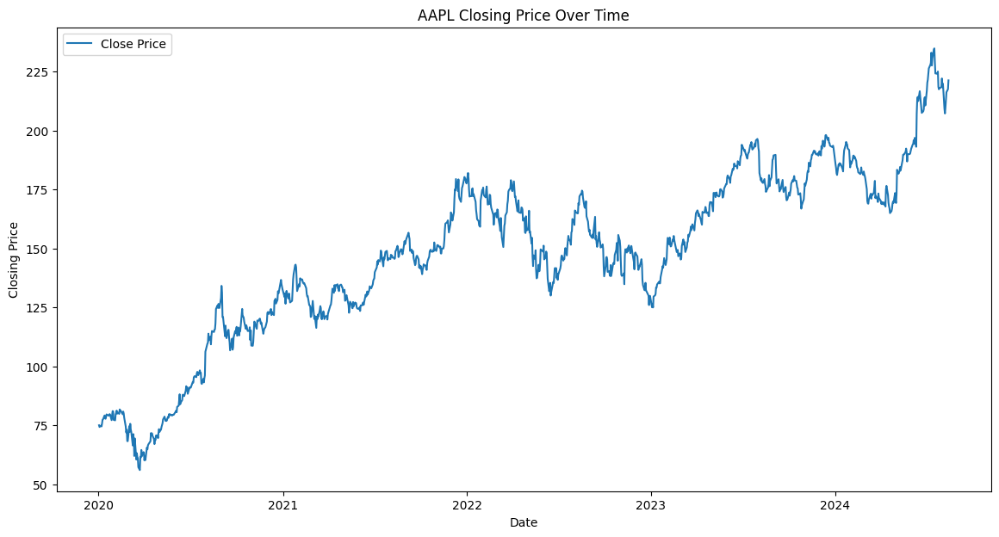

In [7]:
# Plotting the closing price over time
plt.figure(figsize=(14, 7))
plt.plot(data['Close'], label='Close Price')
plt.title(f'{ticker} Closing Price Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

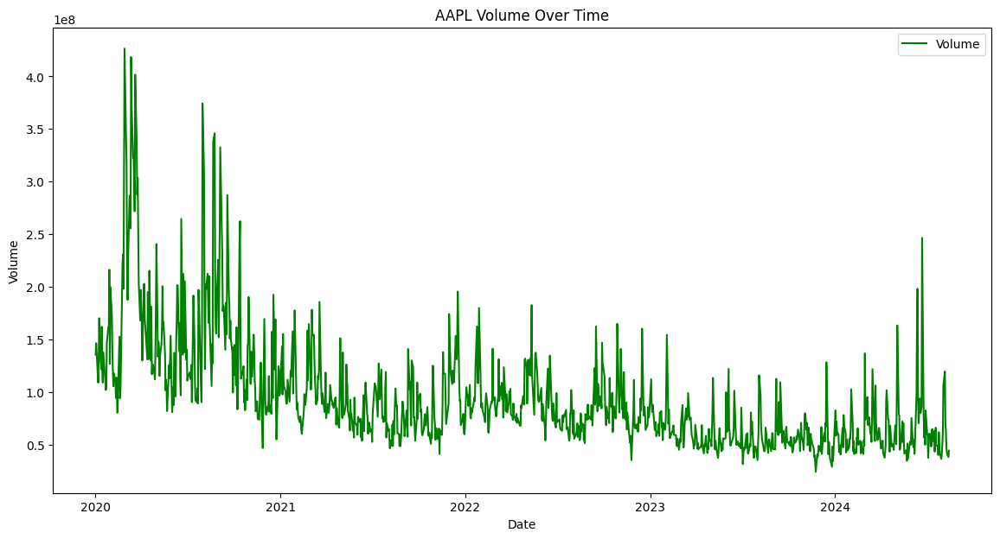

In [8]:
# Plotting the volume over time
plt.figure(figsize=(14, 7))
plt.plot(data.index, data['Volume'], label='Volume', color='green')
plt.title(f'{ticker} Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.show()

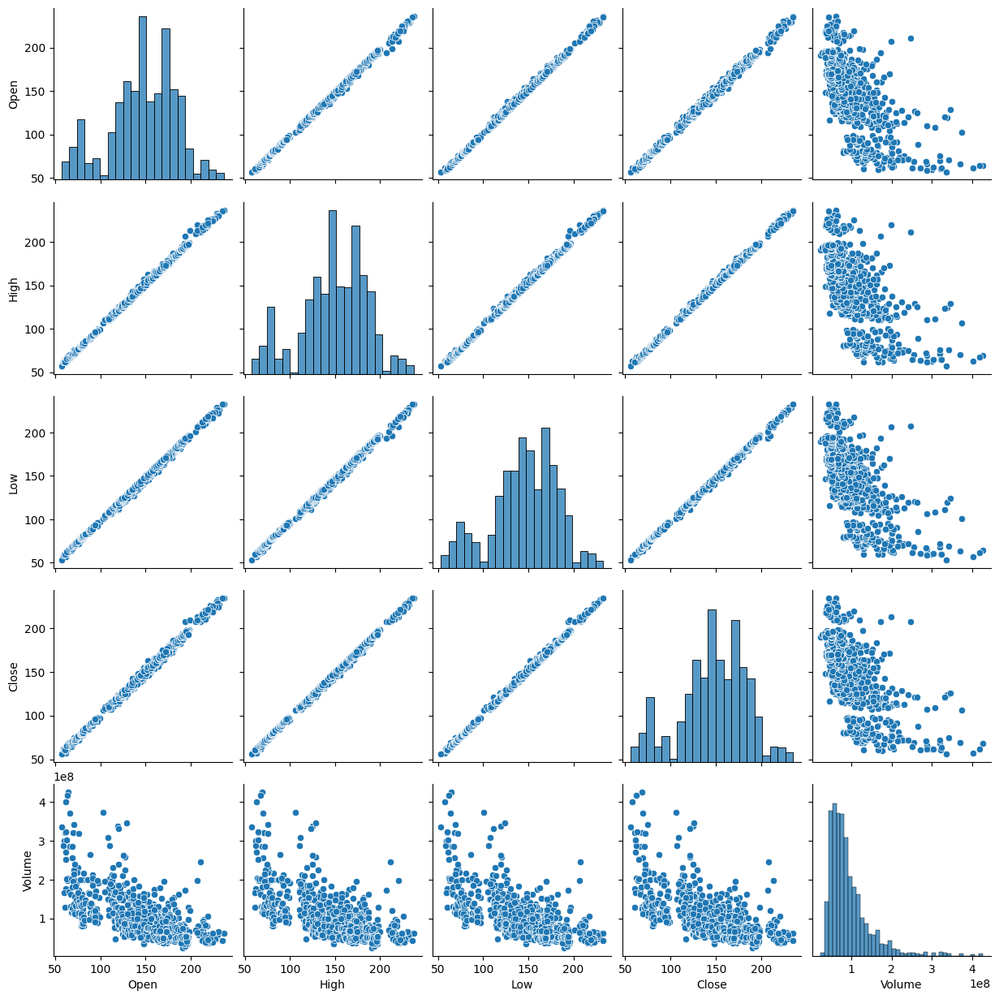

In [9]:
# Pairplot to visualize relationships between features
sns.pairplot(data[['Open', 'High', 'Low', 'Close', 'Volume']])
plt.show()



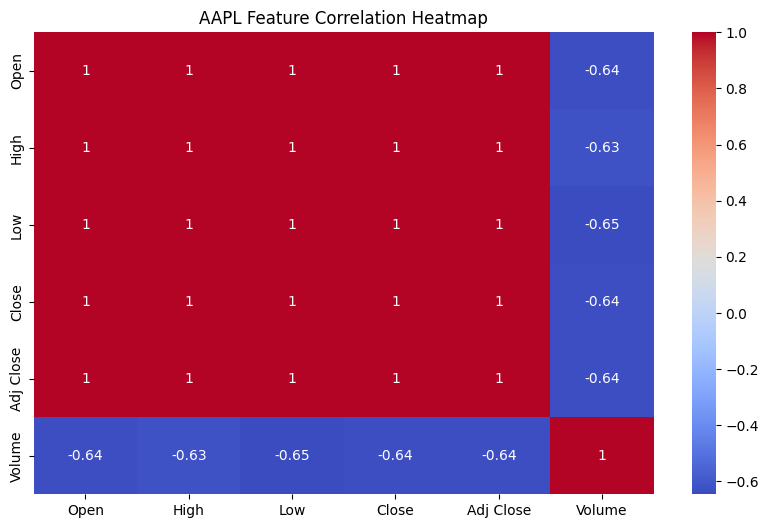

In [10]:
# Heatmap to visualize correlations
plt.figure(figsize=(10, 6))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title(f'{ticker} Feature Correlation Heatmap')
plt.show()

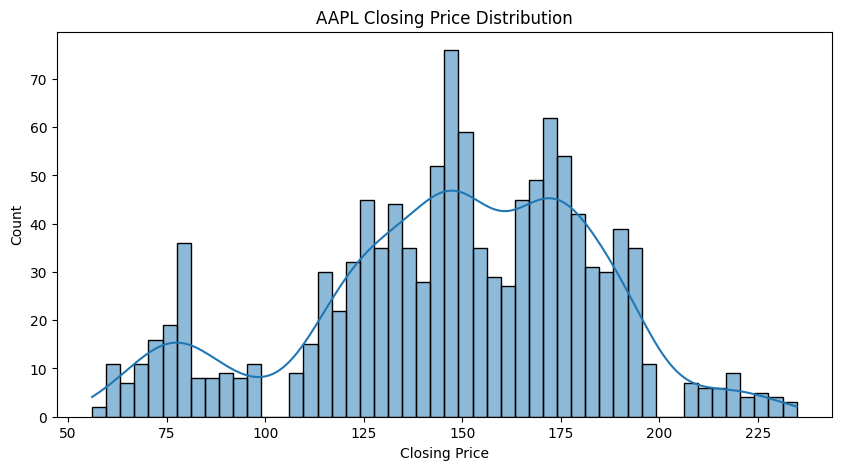

In [11]:
# Distribution of closing prices
plt.figure(figsize=(10, 5))
sns.histplot(data['Close'], bins=50, kde=True)
plt.title(f'{ticker} Closing Price Distribution')
plt.xlabel('Closing Price')
plt.show()

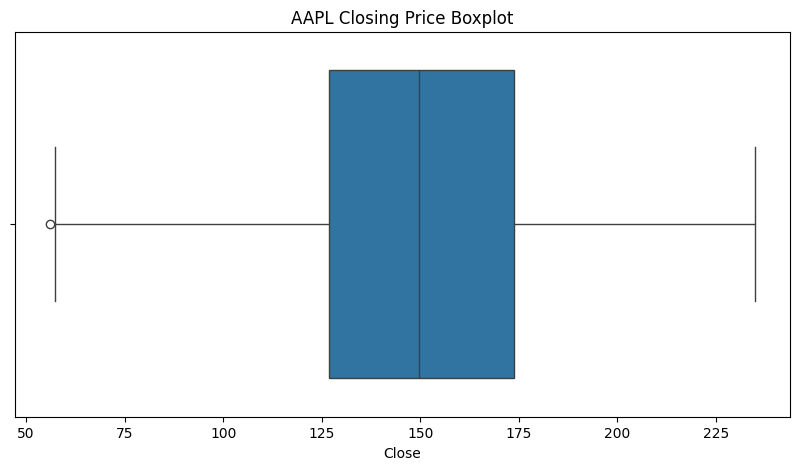

In [12]:
# Boxplot to check for outliers in the closing prices
plt.figure(figsize=(10, 5))
sns.boxplot(x=data['Close'])
plt.title(f'{ticker} Closing Price Boxplot')
plt.show()

## Data Preparation and Feature Engineering

In [14]:
# Moving Averages
data['MA_20'] = data['Close'].rolling(window=20).mean()
data['MA_50'] = data['Close'].rolling(window=50).mean()

In [15]:
# Volatility (Rolling Standard Deviation)
data['Volatility'] = data['Close'].rolling(window=20).std()


In [16]:
# Lag Features
data['Lag_1'] = data['Close'].shift(1)
data['Lag_5'] = data['Close'].shift(5)
data['Lag_10'] = data['Close'].shift(10)

In [17]:
# Normalization/Scaling
scaler = MinMaxScaler()
data[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'MA_20', 'MA_50', 'Volatility', 'Lag_1', 'Lag_5', 'Lag_10']] = scaler.fit_transform(
    data[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'MA_20', 'MA_50', 'Volatility', 'Lag_1', 'Lag_5', 'Lag_10']]
)

In [18]:
print(data.isnull().sum())


Open           0
High           0
Low            0
Close          0
Adj Close      0
Volume         0
MA_20         19
MA_50         49
Volatility    19
Lag_1          1
Lag_5          5
Lag_10        10
dtype: int64


In [19]:
# Drop rows with NaN values resulting from lagging and rolling operations
data.dropna(inplace=True)

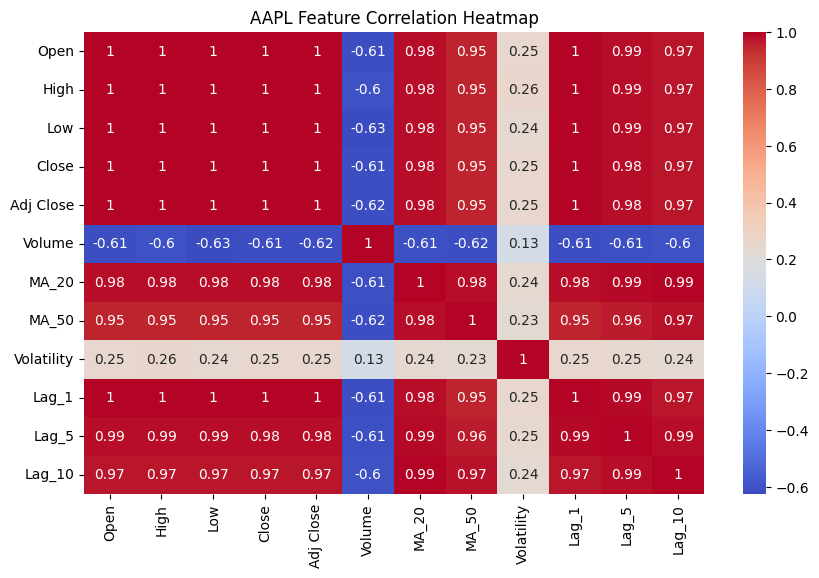

In [20]:
# Heatmap to visualize correlations
plt.figure(figsize=(10, 6))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title(f'{ticker} Feature Correlation Heatmap')
plt.show()

In [21]:
# Drop redundant features
data_reduced = data.drop(columns=['Open', 'High', 'Low', 'Adj Close', 'MA_20', 'Lag_1', 'Lag_10'])

In [22]:
data_reduced.head()

,Close,Volume,MA_50,Volatility,Lag_5
Date,,,,,
2020-03-13,0.074974,0.861408,0.060297,0.439242,0.090445
2020-03-16,0.024954,0.741376,0.058337,0.478260,0.058469
2020-03-17,0.039851,0.745432,0.056835,0.482192,0.085283
2020-03-18,0.031193,0.686240,0.055044,0.472733,0.071422
2020-03-19,0.028549,0.615733,0.053238,0.457164,0.033375


## Model Development and Training

In [23]:
# Splitting Data into Training and Testing Sets
X = data_reduced[['Volume', 'MA_50', 'Volatility' ,'Lag_5']]
y = data_reduced['Close']

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Training set shape: (889, 4)
Testing set shape: (223, 4)


### Linear Regression Model

In [27]:
# Initialize the model
lr_model = LinearRegression()

In [28]:
# Train the model
lr_model.fit(X_train, y_train)

LinearRegression()

In [29]:
# Predict
y_pred_lr = lr_model.predict(X_test)

# Evaluate
mae_lr = mean_absolute_error(y_test, y_pred_lr)
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression - MAE: {mae_lr}, RMSE: {rmse_lr}, R²: {r2_lr}")

Linear Regression - MAE: 0.023811708304639242, RMSE: 0.032065145859887324, R²: 0.9709475168843842


### Decision Tree Regressor Model

In [31]:
# Initialize the model
dt_model = DecisionTreeRegressor(random_state=42)

In [32]:
# Train the model
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [33]:
# Predict
y_pred_dt = dt_model.predict(X_test)

# Evaluate
mae_dt = mean_absolute_error(y_test, y_pred_dt)
rmse_dt = mean_squared_error(y_test, y_pred_dt, squared=False)
r2_dt = r2_score(y_test, y_pred_dt)

print(f"Decision Tree - MAE: {mae_dt}, RMSE: {rmse_dt}, R²: {r2_dt}")

Decision Tree - MAE: 0.02307989020051911, RMSE: 0.03423924244870231, R²: 0.9668742963425943


### Random Forest Regressor Model

In [35]:
# Initialize the model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

In [36]:
# Train the model
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [37]:
# Predict
y_pred_rf = rf_model.predict(X_test)

# Evaluate
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest - MAE: {mae_rf}, RMSE: {rmse_rf}, R²: {r2_rf}")

Random Forest - MAE: 0.0175325204417471, RMSE: 0.02472217541926821, R²: 0.9827300855886266


### Gradient Boosting Machine

In [39]:
# Initialize the model
gbm_model = GradientBoostingRegressor(random_state=42)

In [40]:
# Train the model
gbm_model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [41]:
# Predict
y_pred_gbm = gbm_model.predict(X_test)

# Evaluate
mae_gbm = mean_absolute_error(y_test, y_pred_gbm)
rmse_gbm = mean_squared_error(y_test, y_pred_gbm, squared=False)
r2_gbm = r2_score(y_test, y_pred_gbm)

print(f"Gradient Boosting Machine - MAE: {mae_gbm}, RMSE: {rmse_gbm}, R²: {r2_gbm}")

Gradient Boosting Machine - MAE: 0.019952770735610505, RMSE: 0.027244418461358503, R²: 0.9790264520973151


### Long Short-Term Memory (LSTM) Model

In [43]:
# Reshape the data to be 3D [samples, timesteps, features]
X_train_lstm = np.reshape(X_train.values, (X_train.shape[0], 1, X_train.shape[1]))
X_test_lstm = np.reshape(X_test.values, (X_test.shape[0], 1, X_test.shape[1]))

In [46]:
# Initialize the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(units=50, return_sequences=True, input_shape=(1, X_train.shape[1])))
lstm_model.add(LSTM(units=50, return_sequences=False))
lstm_model.add(Dense(units=1))

# Compile the model
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

In [47]:
# Train the model
lstm_model.fit(X_train_lstm, y_train, epochs=20, batch_size=32)

Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.2757
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0661
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0141
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0075
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0033
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0021
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018
Epoch 10/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019
Epoch 11/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019
Epoch 12/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019
Epoch 13/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018
Epoch 14/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017
Epoch 15/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018
Epoch 16/20
28/28 ━

In [48]:
# Predict
y_pred_lstm = lstm_model.predict(X_test_lstm)

# Evaluate
mae_lstm = mean_absolute_error(y_test, y_pred_lstm)
rmse_lstm = mean_squared_error(y_test, y_pred_lstm, squared=False)
r2_lstm = r2_score(y_test, y_pred_lstm)

print(f"LSTM - MAE: {mae_lstm}, RMSE: {rmse_lstm}, R²: {r2_lstm}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step
LSTM - MAE: 0.031866051840520014, RMSE: 0.04055820716409439, R²: 0.9535191227312891


## Model Interpretations (LIME and SHAP)

In [51]:
# Create a dictionary of models with their names
models = {
    "Linear Regression": lr_model,
    "Random Forest": rf_model,
    "Decision Tree": dt_model,
    "Gradient Boosting Machine": gbm_model,
    "LSTM": lstm_model  # Note that LSTM needs special handling
}

# LIME explanation setup
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Close'],
    mode='regression'
)

In [85]:
# Choose a specific instance to explain
instance = X_test.iloc[0].values

# Generate LIME explanations for each non-LSTM model
for name, model in models.items():
    if name != "LSTM":
        print(f"LIME interpretation for {name}:")
        lime_exp = explainer.explain_instance(instance, model.predict, num_features=5)
        lime_exp.show_in_notebook(show_table=True)

# Special handling for LSTM
def lstm_predict(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))
    return lstm_model.predict(X).flatten()

print("LIME interpretation for LSTM:")
lime_exp_lstm = explainer.explain_instance(instance, lstm_predict, num_features=5)
lime_exp_lstm.show_in_notebook(show_table=True)

LIME interpretation for Linear Regression:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


LIME interpretation for Random Forest:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


LIME interpretation for Decision Tree:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


LIME interpretation for Gradient Boosting Machine:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


LIME interpretation for LSTM:
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


SHAP interpretation for Random Forest:


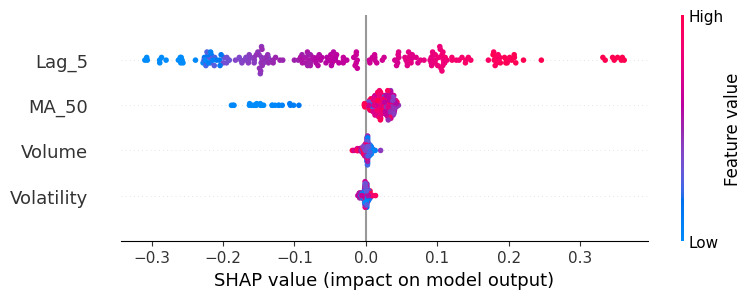

SHAP interpretation for Decision Tree:


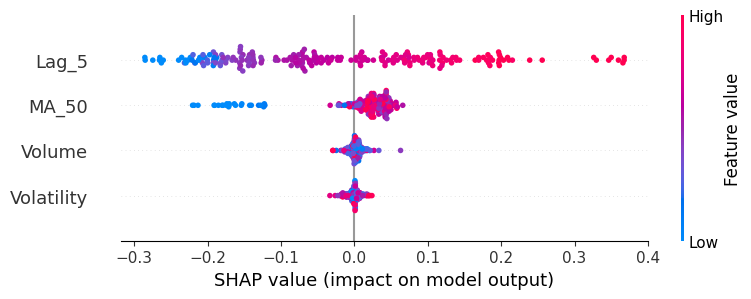

SHAP interpretation for Gradient Boosting Machine:


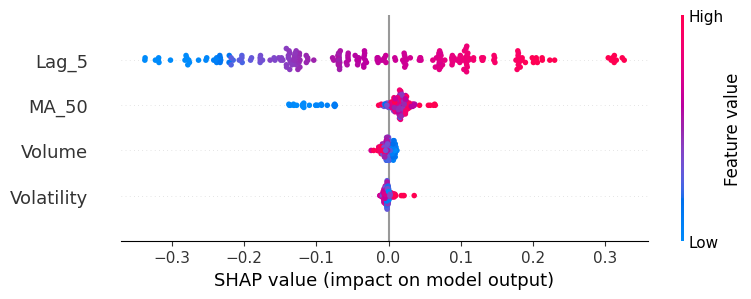

In [60]:
# Create a dictionary of models with their names
models = {
    "Linear Regression": lr_model,
    "Random Forest": rf_model,
    "Decision Tree": dt_model,
    "Gradient Boosting Machine": gbm_model,
    "LSTM": lstm_model
}

# Select an instance to explain
instance = X_test.iloc[0:1]  # Selecting a single instance

# Generating SHAP values for each non-LSTM model
for name, model in models.items():
    if name != "LSTM" and name != "Linear Regression":
        print(f"SHAP interpretation for {name}:")
        explainer = shap.TreeExplainer(model)  # Use TreeExplainer for tree-based models
        shap_values = explainer.shap_values(X_test)

        # Summary plot for global interpretation
        shap.summary_plot(shap_values, X_test, feature_names=X_test.columns)

        # Force plot for a single prediction
        shap.force_plot(explainer.expected_value, shap_values[0], instance, feature_names=X_test.columns)

SHAP interpretation for Linear Regression:


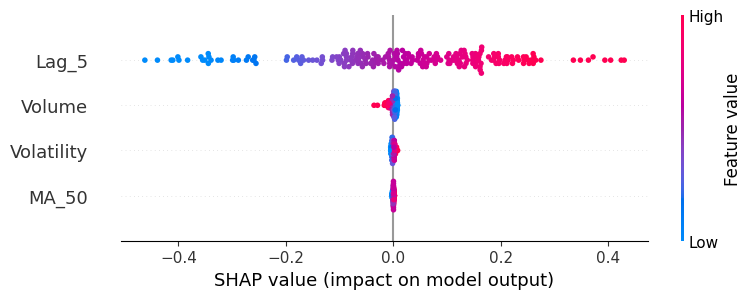

In [61]:
print(f"SHAP interpretation for Linear Regression:")
explainer = shap.LinearExplainer(lr_model, X_test)  # Use LinearExplainer for linear models
shap_values = explainer.shap_values(X_test)

# Visualize the SHAP values
shap.summary_plot(shap_values, X_test)

SHAP interpretation for LSTM using KernelExplainer:
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


  0%|          | 0/223 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

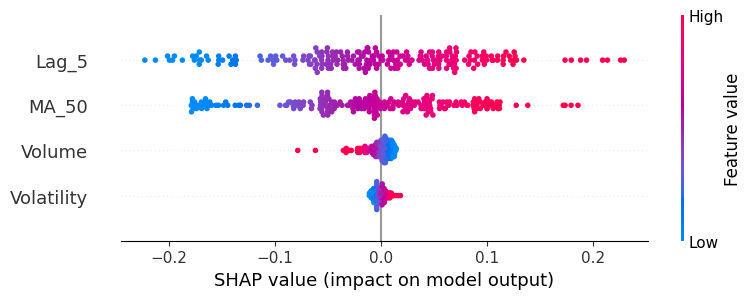

In [62]:
# Special handling for LSTM using KernelExplainer
print("SHAP interpretation for LSTM using KernelExplainer:")
# Flatten the LSTM input for SHAP since KernelExplainer expects 2D input
X_train_flat = X_train.values  # Flatten the data for KernelExplainer
X_test_flat = X_test.values  # Flatten the data for KernelExplainer

# Define a prediction function that handles the 3D to 2D transformation
def lstm_predict(X):
    X_reshaped = np.reshape(X, (X.shape[0], 1, X.shape[1]))
    return lstm_model.predict(X_reshaped).flatten()

# KernelExplainer setup
explainer_lstm = shap.KernelExplainer(lstm_predict, X_train_flat[:100])  # Use a small subset for KernelExplainer
shap_values_lstm = explainer_lstm.shap_values(X_test_flat)

# Summary plot for global interpretation
shap.summary_plot(shap_values_lstm, X_test_flat, feature_names=X_test.columns)

# Force plot for a single prediction
shap.force_plot(np.mean(shap_values_lstm), shap_values_lstm[0], X_test_flat[0], feature_names=X_test.columns)